In [1]:
import sys
import os
#import subprocess

#from functools import reduce

import pandas as pd
#import numpy as np
import matplotlib.pyplot as plt
import scienceplots
#import time
#from scipy.optimize import minimize
#from sklearn.linear_model import LinearRegression
#import glob
#import datetime
#import scipy
#from scipy.sparse import diags


#from scipy.linalg import solve_banded
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
import matplotlib.ticker as ticker


#from sklearn.metrics import mean_squared_error


# Point de départ : dossier courant
current_dir = os.getcwd()

# Chemin du dossier 'modules' situé au même niveau que 'src'
module_path = os.path.abspath(os.path.join(current_dir, '..', 'libs'))
if module_path not in sys.path:
    sys.path.append(module_path)

# Maintenant, tu peux importer ton module
from SCOU_NC_Vanilla_NUTS_manual import *

WARNING (pytensor.tensor.blas): Using NumPy C-API based implementation for BLAS functions.


In [2]:
def get_month_start_days():
    return pd.date_range('2023-01-01', '2023-12-31', freq='MS').dayofyear.tolist()

def get_month_start_labels():
    return pd.date_range('2023-01-01', '2023-12-31', freq='MS').strftime('%m-%d').tolist()


In [3]:
def get_sub_data(input_data, indicator, wwtp, outlier_threshold=0.7):
    this_lod = lods_dict[indicator]
    
    output_data = input_data.copy()
    output_data = output_data.loc[::, ['dateStart', indicator, 'plantVolume']]
    output_data.columns = ['dateStart', 'obs_conc', 'plantVolume']
    output_data['lod_conc'] = this_lod
    
    # for error checking purpose
    output_data['obs_raw'] = output_data.obs_conc.copy()
    output_data['lod_raw'] = output_data.lod_conc.copy()
    
    output_data['obs'] = output_data.obs_conc * output_data.plantVolume
    output_data['lod'] = output_data.lod_conc * output_data.plantVolume

    output_data.obs_conc = np.log(output_data.obs_conc)
    output_data.lod_conc = np.log(output_data.lod_conc)
    
    output_data.obs = np.log(output_data.obs)
    output_data.lod = np.log(output_data.lod)
    
    columns = ['dateStart', 'obs', 'lod', 'plantVolume', 'obs_conc', 'lod_conc', 'obs_raw', 'lod_raw'] 
    output_data = output_data.loc[::, columns]

    conc_output_file = pd.read_csv('../outputs/files/pop_estimation_' + wwtp + '_conc/' + indicator + '.csv', sep=";")
    remove_those = conc_output_file.loc[conc_output_file.pout>=outlier_threshold].dateStart.tolist()
    print(len(remove_those))
    
    dropems = output_data.loc[output_data.dateStart.isin(remove_those)].index.tolist()
    output_data = output_data.drop(dropems, axis=0)
    output_data.reset_index(inplace=True, drop=True)
    print(output_data.shape)
    output_data = output_data.set_index('dateStart').resample('D').mean().reset_index()  

    return output_data

In [4]:
def append_and_process_results(input_data, this_molecule):
    input_data['muX'] = snc_ar1_nuts_flux.muX
    input_data['ICL'] = snc_ar1_nuts_flux.CIL
    input_data['ICU'] = snc_ar1_nuts_flux.CIU
    input_data['pout'] = snc_ar1_nuts_flux.pointwise_pout
    
    input_data.obs = np.log10(np.exp(input_data.obs))
    input_data.muX = np.log10(np.exp(input_data.muX))
    input_data.ICL = np.log10(np.exp(input_data.ICL))
    input_data.ICU = np.log10(np.exp(input_data.ICU))
    common_flux_data[this_molecule] = input_data.copy() 

    return input_data

In [5]:
def visualize_results(input_data, this_molecule):
    
    with plt.style.context(['science', 'notebook', 'grid']):

        LABEL_SIZE = 30
        TICK_SIZE = 30
        TITLE_SIZE = 38
        LEGEND_SIZE = 30
        DATES_SIZE = 18
        figsize = (28, 10) #figsize = (32, 10)
        
        plt.rc('axes', labelsize=LABEL_SIZE)
        plt.rc('xtick', labelsize=TICK_SIZE)   
        plt.rc('ytick', labelsize=TICK_SIZE)
        plt.rc('figure', titlesize=TITLE_SIZE)
        plt.rc('legend', fontsize=LEGEND_SIZE)
        plt.rcParams['text.usetex'] = True
        
        fig = plt.figure(figsize=figsize, layout="constrained")
        
        ax_dict = fig.subplot_mosaic(
            """
            A
            """
        )
        
        ### A
        ax_dict['A'].plot(input_data.dateStart.values, input_data.muX.values, label='$X^*_{t_{opt}}$', color='green', linewidth=8, zorder=3)
        
        ax_dict['A'].plot(input_data.dateStart.values, input_data.ICL.values, label='95% CI', linestyle='--', color='green', linewidth=5, zorder=1)
        ax_dict['A'].plot(input_data.dateStart.values, input_data.ICU.values, linestyle='--', color='green', linewidth=5, zorder=1)
        
        ax_dict['A'].fill_between(input_data.dateStart.values, input_data.ICL.values, input_data.ICU.values, alpha=.3, color='green')
    
        
        scatter_points = ax_dict['A'].scatter(input_data.dateStart.values, input_data.obs.values, label='$\hat{X}_t$', 
                             c=input_data.pout.values,
                             cmap='bwr', edgecolor='black', s=360, zorder=3,
                             linewidths=1.5, alpha=0.9, vmin=0, vmax=1)
    
        
        ax_dict['A'].set_ylabel("Concentration (UG/L) - $\log_{10}$ scale")
        ax_dict['A'].set_xlabel("Sampling date")
        ax_dict['A'].tick_params(axis='x', labelsize=TICK_SIZE)
        ax_dict['A'].tick_params(axis='y', labelsize=TICK_SIZE)
        ax_dict['A'].grid(linewidth=1, color='black', alpha=0.8)
        ax_dict['A'].set_title(this_molecule, size=TITLE_SIZE)
    
        ### Outlier probability legend:
        cmin, cmax = 0.0, 1.0 
        axins1 = inset_axes(ax_dict['A'], width='2%', height='100%', loc='right', borderpad=0)
        axins1.grid(False)
        cbar = fig.colorbar(scatter_points, cax=axins1, orientation='vertical')
        
        # Setting tick limits:
        cbar.set_ticks([cmin, cmax])
        cbar.ax.yaxis.set_major_locator(ticker.FixedLocator([cmin, cmax]))
        
        # Standardizing the float format displayed:
        decimal_places = 1
        cbar.ax.set_yticklabels([f"{cmin:.{decimal_places}f}", f"{cmax:.{decimal_places}f}"], fontsize=TICK_SIZE)
    
        # Placing the label at the right spot:
        cbar.ax.set_ylabel('Outlier probability', size=TICK_SIZE, labelpad=-35)
    
        # Main legend
        plt.rcParams['text.usetex'] = False
        h1, l1 = ax_dict['A'].get_legend_handles_labels()
        fig.legend(h1, l1, loc='upper center', bbox_to_anchor=(0.5, 0), fancybox=True, shadow=True, ncol=5)
        
        plt.show()

In [6]:
wwtp = 'SEV'

In [7]:
filepath = '../data/samples_quantifications.xlsx'

raw_data = pd.read_excel(filepath, sheet_name=wwtp)
raw_data = raw_data.loc[1:]
raw_data = raw_data.rename(columns={wwtp:'dateStart',
                                   'Débit Total station':'plantVolume'})

raw_data.dateStart = pd.to_datetime(raw_data.dateStart)
raw_data.plantVolume = pd.to_numeric(raw_data.plantVolume)
raw_data.DBO = pd.to_numeric(raw_data.DBO)
raw_data.DCO = pd.to_numeric(raw_data.DCO)
raw_data.MES = pd.to_numeric(raw_data.MES)
raw_data.NGL = pd.to_numeric(raw_data.NGL)
raw_data.NH4 = pd.to_numeric(raw_data.NH4)
raw_data.NTK = pd.to_numeric(raw_data.NTK)
raw_data.PT = pd.to_numeric(raw_data.PT)

raw_data['month'] = raw_data.dateStart.dt.month
raw_data['year'] = raw_data.dateStart.dt.year
raw_data['day'] = raw_data.dateStart.dt.dayofyear

In [8]:
lods_dict = {}
lods_dict['DBO'] = 1
lods_dict['DCO'] = 4
lods_dict['MES'] = 2
lods_dict['NH4'] = 0.3
lods_dict['NTK'] = 0.5
lods_dict['NGL'] = 0.92
lods_dict['PT'] = 0.3

In [9]:
subraw_data = raw_data.copy()
subraw_data = subraw_data.loc[~subraw_data.dateStart.isna()]
subraw_data.plantVolume = subraw_data.plantVolume.replace(0, 1) # avoid inf after log-transformation
subraw_data = subraw_data.loc[subraw_data.year>=2020]

In [10]:
chain_selector_dict = {}
chain_selector_dict['DBO'] = []
chain_selector_dict['DCO'] = []
chain_selector_dict['MES'] = []
chain_selector_dict['NH4'] = []
chain_selector_dict['NTK'] = []
chain_selector_dict['NGL'] = []
chain_selector_dict['PT'] = []

In [11]:
nb_chains = 10
tuning_iters = 4000
sampling_iters = 2000

DBO
30
(1797, 8)


/opt/anaconda3/envs/pymc5/lib/python3.9/site-packages/pymc/distributions/timeseries.py:558: UserWarning: Initial distribution not specified, defaulting to `Normal.dist(0, 100, shape=...)`. You can specify an init_dist manually to suppress this warning.
  warnings.warn(
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (10 chains in 4 jobs)
NUTS: [sig, eps, latent]


Sampling 10 chains for 4_000 tune and 2_000 draw iterations (40_000 + 20_000 draws total) took 211 seconds.
The rhat statistic is larger than 1.01 for some parameters. This indicates problems during sampling. See https://arxiv.org/abs/1903.08008 for details
The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details


Raw summary:
      mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
sig  0.050  0.003   0.044    0.057        0.0      0.0     970.0    1952.0   
eps  0.136  0.003   0.130    0.141        0.0      0.0    4622.0   10561.0   

     r_hat  
sig   1.01  
eps   1.00  


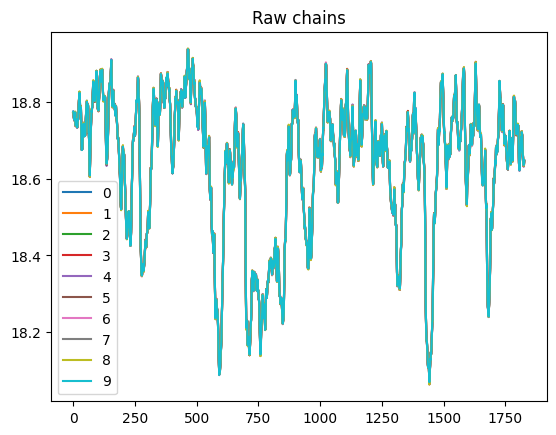

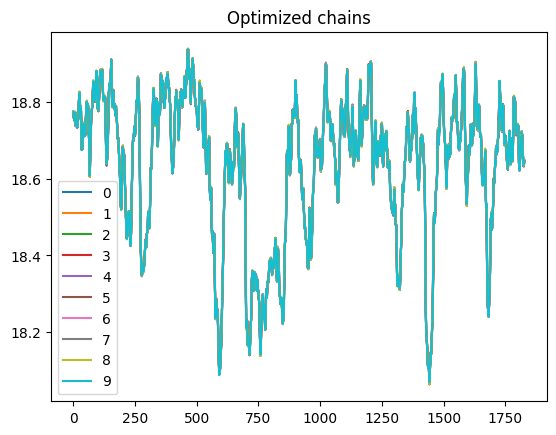

Best chain combination summary:
      mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
sig  0.050  0.003   0.044    0.057        0.0      0.0     970.0    1952.0   
eps  0.136  0.003   0.130    0.141        0.0      0.0    4622.0   10561.0   

     r_hat  
sig   1.01  
eps   1.00  


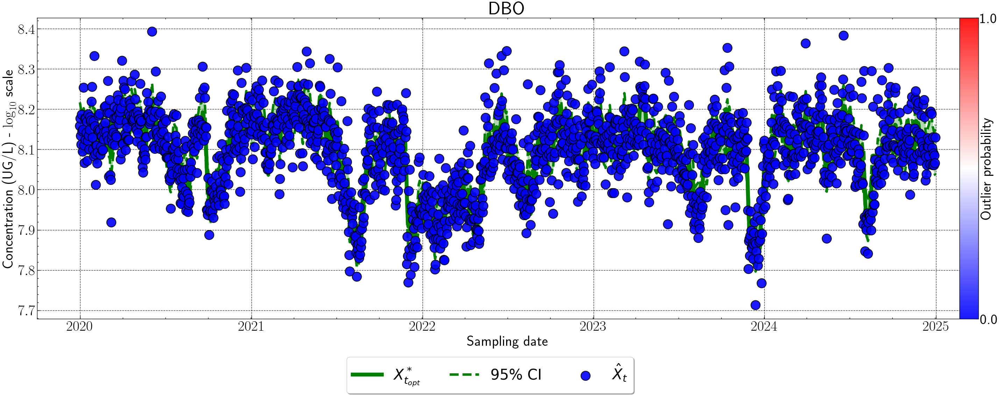

DCO
34
(1793, 8)


/opt/anaconda3/envs/pymc5/lib/python3.9/site-packages/pymc/distributions/timeseries.py:558: UserWarning: Initial distribution not specified, defaulting to `Normal.dist(0, 100, shape=...)`. You can specify an init_dist manually to suppress this warning.
  warnings.warn(
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (10 chains in 4 jobs)
NUTS: [sig, eps, latent]


Sampling 10 chains for 4_000 tune and 2_000 draw iterations (40_000 + 20_000 draws total) took 220 seconds.
The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details


Raw summary:
      mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
sig  0.048  0.003   0.042    0.055        0.0      0.0     920.0    1871.0   
eps  0.140  0.003   0.135    0.146        0.0      0.0    5001.0   10711.0   

     r_hat  
sig   1.01  
eps   1.00  


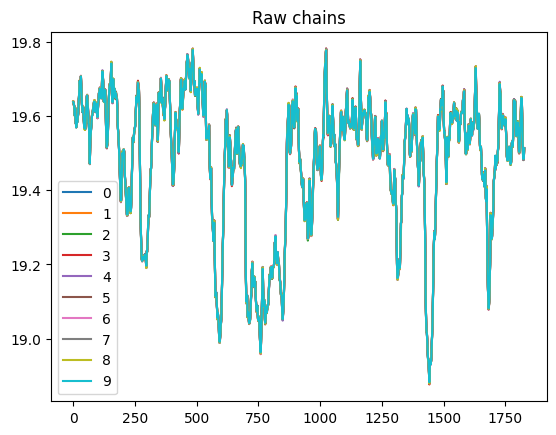

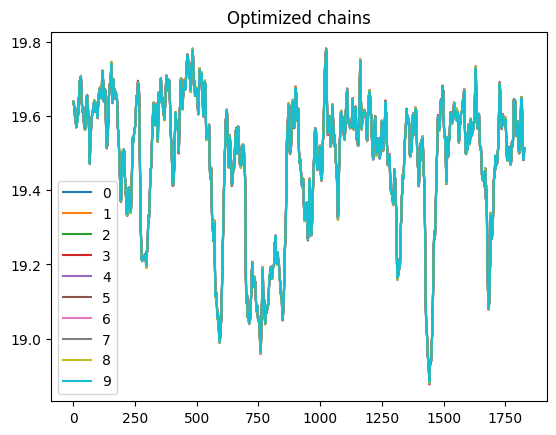

Best chain combination summary:
      mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
sig  0.048  0.003   0.042    0.055        0.0      0.0     920.0    1871.0   
eps  0.140  0.003   0.135    0.146        0.0      0.0    5001.0   10711.0   

     r_hat  
sig   1.01  
eps   1.00  


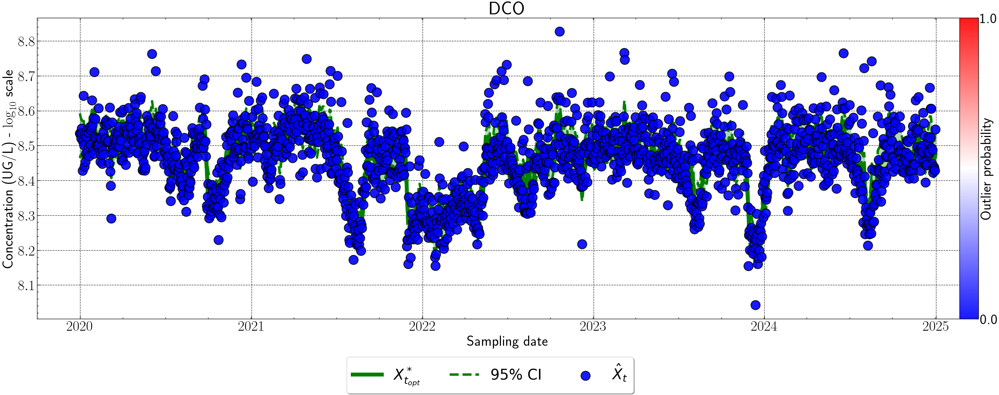

MES
25
(1802, 8)


/opt/anaconda3/envs/pymc5/lib/python3.9/site-packages/pymc/distributions/timeseries.py:558: UserWarning: Initial distribution not specified, defaulting to `Normal.dist(0, 100, shape=...)`. You can specify an init_dist manually to suppress this warning.
  warnings.warn(
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (10 chains in 4 jobs)
NUTS: [sig, eps, latent]


Sampling 10 chains for 4_000 tune and 2_000 draw iterations (40_000 + 20_000 draws total) took 236 seconds.
The rhat statistic is larger than 1.01 for some parameters. This indicates problems during sampling. See https://arxiv.org/abs/1903.08008 for details
The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details


Raw summary:
      mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
sig  0.055  0.004   0.047    0.063        0.0      0.0     628.0    1268.0   
eps  0.180  0.004   0.173    0.187        0.0      0.0    3135.0    8808.0   

     r_hat  
sig   1.01  
eps   1.00  


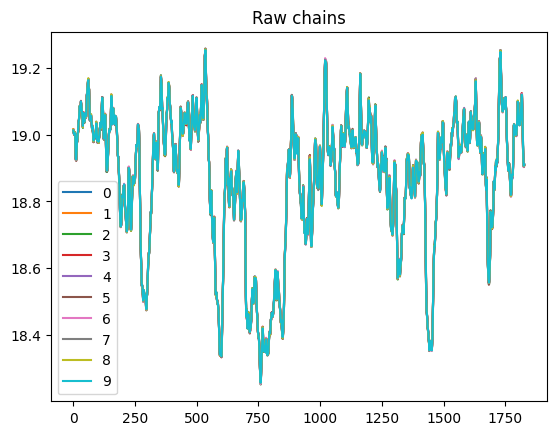

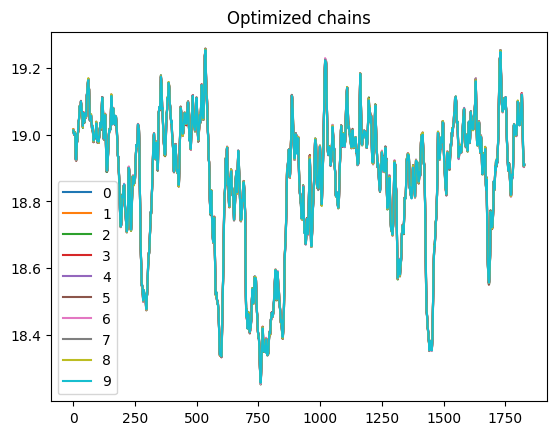

Best chain combination summary:
      mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
sig  0.055  0.004   0.047    0.063        0.0      0.0     628.0    1268.0   
eps  0.180  0.004   0.173    0.187        0.0      0.0    3135.0    8808.0   

     r_hat  
sig   1.01  
eps   1.00  


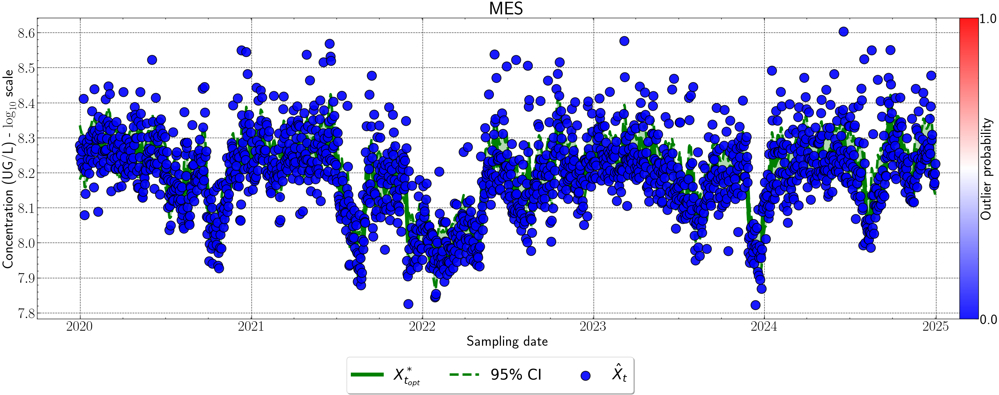

NH4
122
(1705, 8)


/opt/anaconda3/envs/pymc5/lib/python3.9/site-packages/pymc/distributions/timeseries.py:558: UserWarning: Initial distribution not specified, defaulting to `Normal.dist(0, 100, shape=...)`. You can specify an init_dist manually to suppress this warning.
  warnings.warn(
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (10 chains in 4 jobs)
NUTS: [sig, eps, latent]


Sampling 10 chains for 4_000 tune and 2_000 draw iterations (40_000 + 20_000 draws total) took 92 seconds.


Raw summary:
      mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
sig  0.046  0.002   0.042    0.050        0.0      0.0    2579.0    5983.0   
eps  0.049  0.002   0.046    0.053        0.0      0.0    3969.0    7525.0   

     r_hat  
sig    1.0  
eps    1.0  


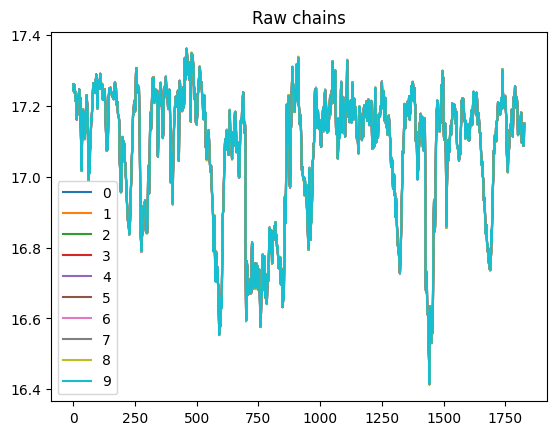

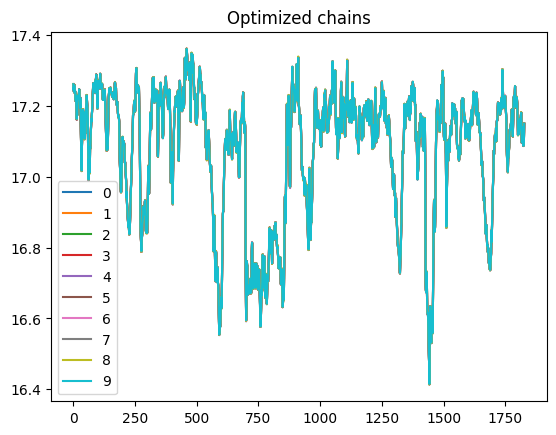

Best chain combination summary:
      mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
sig  0.046  0.002   0.042    0.050        0.0      0.0    2579.0    5983.0   
eps  0.049  0.002   0.046    0.053        0.0      0.0    3969.0    7525.0   

     r_hat  
sig    1.0  
eps    1.0  


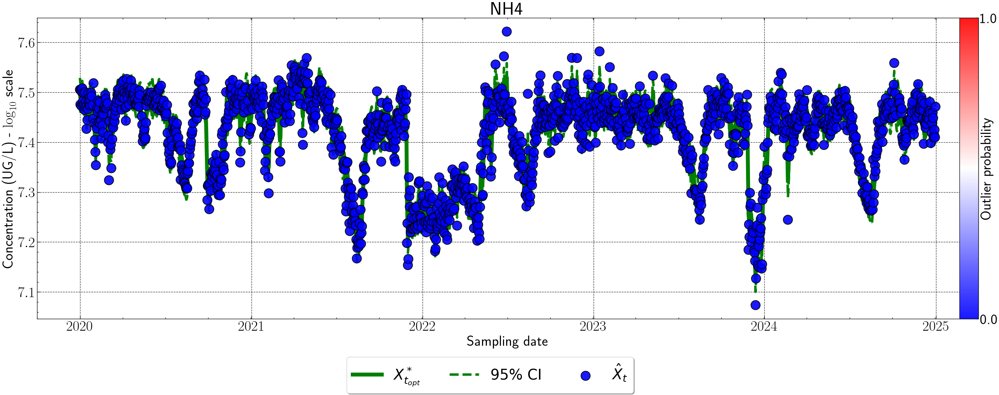

NTK
102
(1725, 8)


/opt/anaconda3/envs/pymc5/lib/python3.9/site-packages/pymc/distributions/timeseries.py:558: UserWarning: Initial distribution not specified, defaulting to `Normal.dist(0, 100, shape=...)`. You can specify an init_dist manually to suppress this warning.
  warnings.warn(
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (10 chains in 4 jobs)
NUTS: [sig, eps, latent]


Sampling 10 chains for 4_000 tune and 2_000 draw iterations (40_000 + 20_000 draws total) took 179 seconds.


Raw summary:
      mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
sig  0.044  0.002   0.039    0.048        0.0      0.0    1725.0    3228.0   
eps  0.065  0.002   0.062    0.069        0.0      0.0    4491.0    9628.0   

     r_hat  
sig   1.01  
eps   1.00  


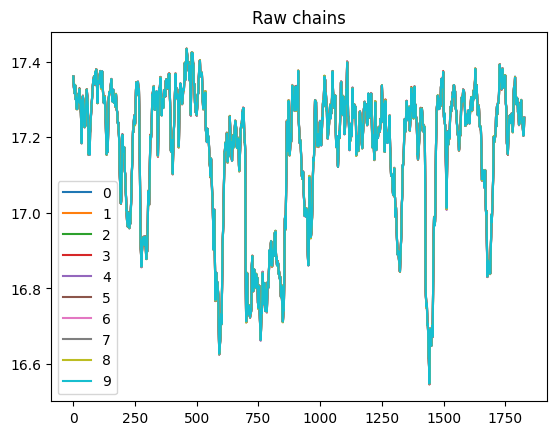

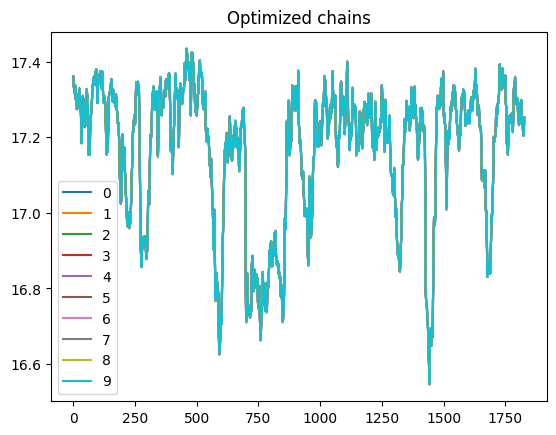

Best chain combination summary:
      mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
sig  0.044  0.002   0.039    0.048        0.0      0.0    1725.0    3228.0   
eps  0.065  0.002   0.062    0.069        0.0      0.0    4491.0    9628.0   

     r_hat  
sig   1.01  
eps   1.00  


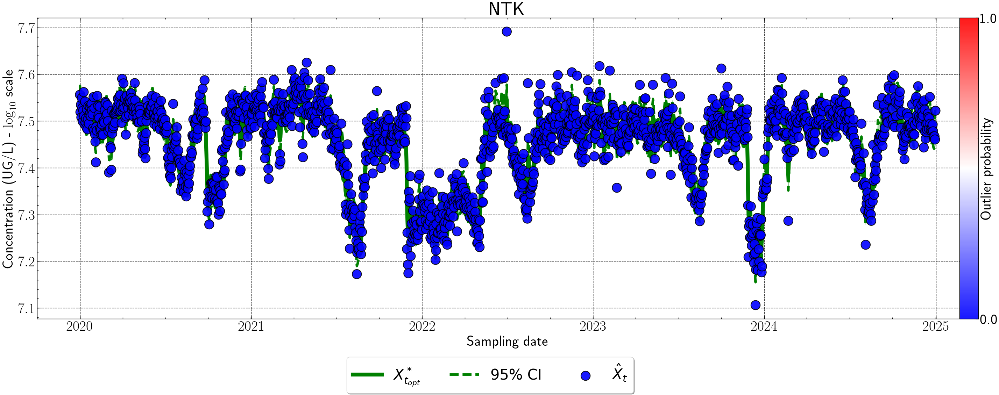

NGL
105
(1722, 8)


/opt/anaconda3/envs/pymc5/lib/python3.9/site-packages/pymc/distributions/timeseries.py:558: UserWarning: Initial distribution not specified, defaulting to `Normal.dist(0, 100, shape=...)`. You can specify an init_dist manually to suppress this warning.
  warnings.warn(
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (10 chains in 4 jobs)
NUTS: [sig, eps, latent]


Sampling 10 chains for 4_000 tune and 2_000 draw iterations (40_000 + 20_000 draws total) took 184 seconds.


Raw summary:
      mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
sig  0.043  0.002   0.039    0.048        0.0      0.0    1466.0    3118.0   
eps  0.066  0.002   0.062    0.070        0.0      0.0    4210.0    9094.0   

     r_hat  
sig   1.01  
eps   1.00  


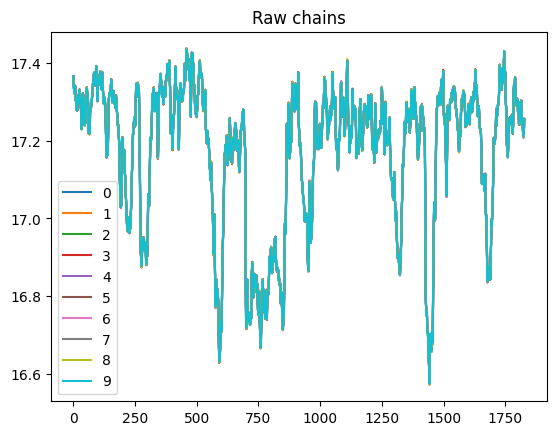

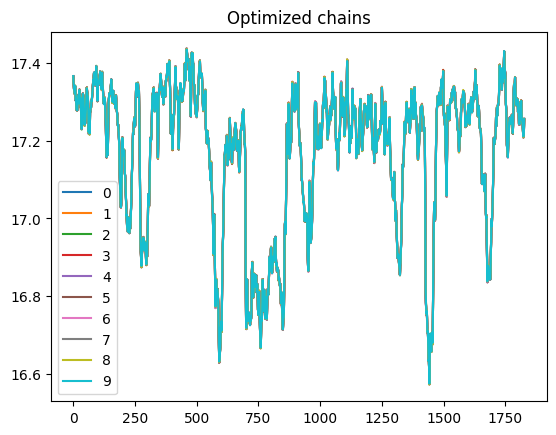

Best chain combination summary:
      mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
sig  0.043  0.002   0.039    0.048        0.0      0.0    1466.0    3118.0   
eps  0.066  0.002   0.062    0.070        0.0      0.0    4210.0    9094.0   

     r_hat  
sig   1.01  
eps   1.00  


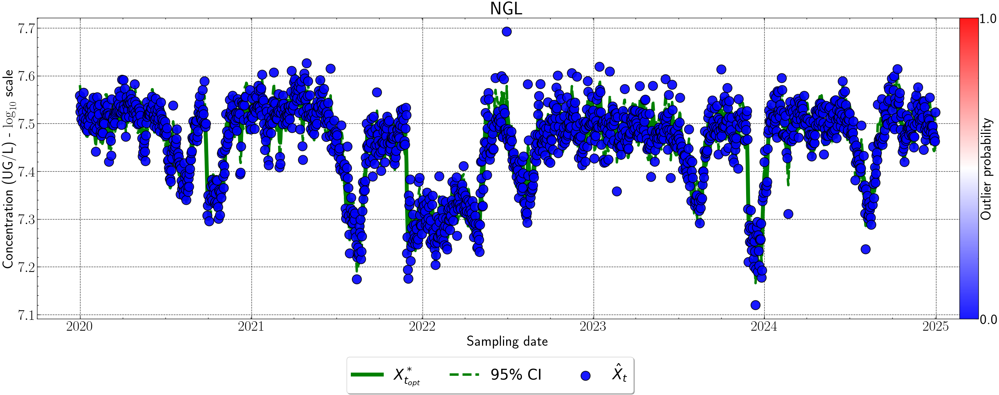

PT
21
(1806, 8)


/opt/anaconda3/envs/pymc5/lib/python3.9/site-packages/pymc/distributions/timeseries.py:558: UserWarning: Initial distribution not specified, defaulting to `Normal.dist(0, 100, shape=...)`. You can specify an init_dist manually to suppress this warning.
  warnings.warn(
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (10 chains in 4 jobs)
NUTS: [sig, eps, latent]


Sampling 10 chains for 4_000 tune and 2_000 draw iterations (40_000 + 20_000 draws total) took 197 seconds.


Raw summary:
      mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
sig  0.045  0.003   0.039    0.050        0.0      0.0    1101.0    2268.0   
eps  0.109  0.002   0.105    0.114        0.0      0.0    6394.0   13487.0   

     r_hat  
sig   1.01  
eps   1.00  


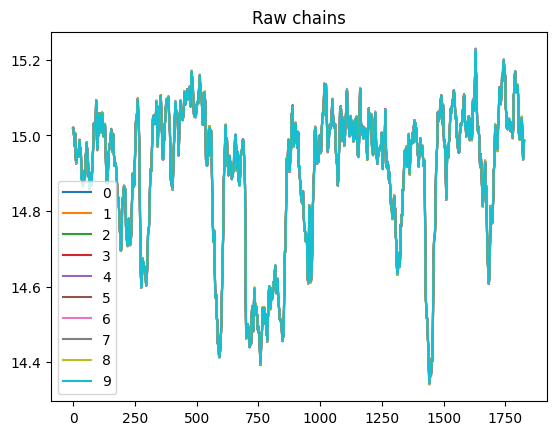

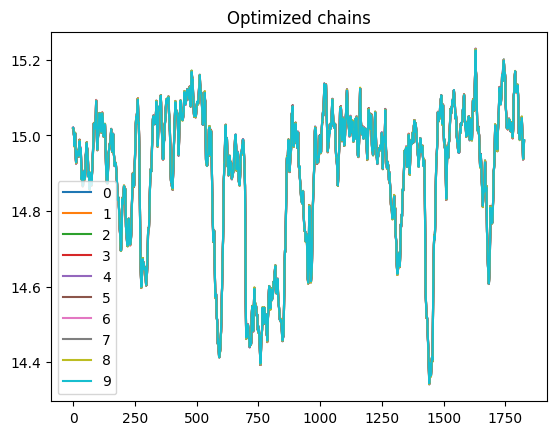

Best chain combination summary:
      mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
sig  0.045  0.003   0.039    0.050        0.0      0.0    1101.0    2268.0   
eps  0.109  0.002   0.105    0.114        0.0      0.0    6394.0   13487.0   

     r_hat  
sig   1.01  
eps   1.00  


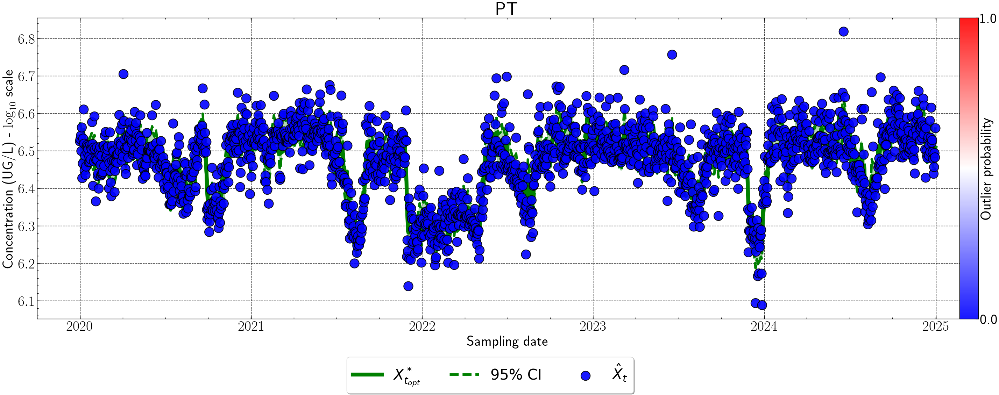

In [12]:
common_flux_data = {}
### Global loop
for this_molecule in list(chain_selector_dict.keys()):

    print("==========")
    print(this_molecule)
    print("==========")
    
    sub_data = get_sub_data(subraw_data, this_molecule, wwtp)

    lod_vect = sub_data.lod.values
    observation_matrix = sub_data.obs.values
    
    snc_ar1_nuts_flux = SCOU_RW1_NUTS(observation_matrix, lod_vect, tuning_iters=tuning_iters, sampling_iters=sampling_iters,
                                 export_name=None, 
                                 p_out_frozen=0.0, nb_chains=nb_chains, export_chains=False,
                                 RW_order=1)
    
    snc_ar1_nuts_flux.fit()

    # getting rid of strongly diverging chains:
    selected_chains = np.arange(nb_chains).tolist()
    remove_those = chain_selector_dict[this_molecule]
    for i in remove_those:
        selected_chains.remove(i)
    
    snc_ar1_nuts_flux.visualize_latents(selected_chains)
    snc_ar1_nuts_flux.predict(selected_chains)

    sub_data = append_and_process_results(sub_data, this_molecule)
    visualize_results(sub_data, this_molecule)

In [13]:
for molecule in list(common_flux_data.keys()):
    this_file = common_flux_data[molecule]
    this_file.to_csv('../outputs/files/pop_estimation_' + wwtp + '_hierarchical_manuscript/' + molecule + '.csv', sep=';', index=False)

In [14]:
wwtp = 'MAV'

In [15]:
filepath = '../data/samples_quantifications.xlsx'

raw_data = pd.read_excel(filepath, sheet_name=wwtp)
raw_data = raw_data.loc[1:]
raw_data = raw_data.rename(columns={wwtp:'dateStart',
                                   'Débit Total station':'plantVolume'})

raw_data.dateStart = pd.to_datetime(raw_data.dateStart)
raw_data.plantVolume = pd.to_numeric(raw_data.plantVolume)
raw_data.DBO = pd.to_numeric(raw_data.DBO)
raw_data.DCO = pd.to_numeric(raw_data.DCO)
raw_data.MES = pd.to_numeric(raw_data.MES)
raw_data.NGL = pd.to_numeric(raw_data.NGL)
raw_data.NH4 = pd.to_numeric(raw_data.NH4)
raw_data.NTK = pd.to_numeric(raw_data.NTK)
raw_data.PT = pd.to_numeric(raw_data.PT)

raw_data['month'] = raw_data.dateStart.dt.month
raw_data['year'] = raw_data.dateStart.dt.year
raw_data['day'] = raw_data.dateStart.dt.dayofyear

In [16]:
subraw_data = raw_data.copy()
subraw_data = subraw_data.loc[~subraw_data.dateStart.isna()]
subraw_data.plantVolume = subraw_data.plantVolume.replace(0, 1) # avoid inf after log-transformation
subraw_data = subraw_data.loc[subraw_data.year>=2020]

In [17]:
chain_selector_dict = {}
chain_selector_dict['DBO'] = []
chain_selector_dict['DCO'] = []
chain_selector_dict['MES'] = []
chain_selector_dict['NH4'] = []
chain_selector_dict['NTK'] = []
chain_selector_dict['NGL'] = []
chain_selector_dict['PT'] = []

DBO
29
(1797, 8)


/opt/anaconda3/envs/pymc5/lib/python3.9/site-packages/pymc/distributions/timeseries.py:558: UserWarning: Initial distribution not specified, defaulting to `Normal.dist(0, 100, shape=...)`. You can specify an init_dist manually to suppress this warning.
  warnings.warn(
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (10 chains in 4 jobs)
NUTS: [sig, eps, latent]


Sampling 10 chains for 4_000 tune and 2_000 draw iterations (40_000 + 20_000 draws total) took 193 seconds.


Raw summary:
      mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
sig  0.096  0.005   0.086    0.106        0.0      0.0    1472.0    3215.0   
eps  0.144  0.004   0.136    0.152        0.0      0.0    3612.0    8830.0   

     r_hat  
sig    1.0  
eps    1.0  


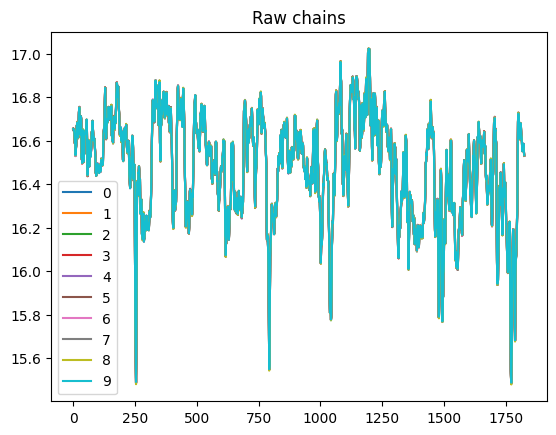

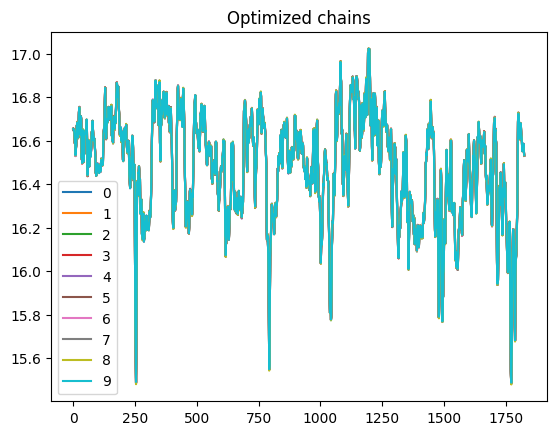

Best chain combination summary:
      mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
sig  0.096  0.005   0.086    0.106        0.0      0.0    1472.0    3215.0   
eps  0.144  0.004   0.136    0.152        0.0      0.0    3612.0    8830.0   

     r_hat  
sig    1.0  
eps    1.0  


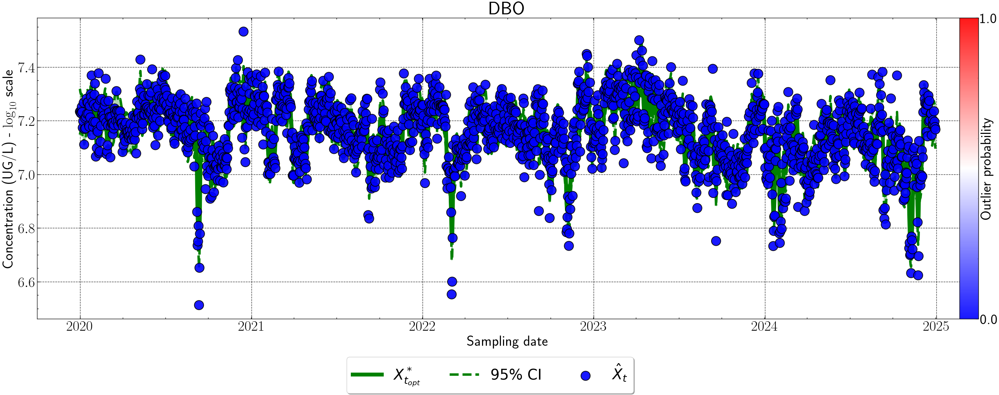

DCO
20
(1806, 8)


/opt/anaconda3/envs/pymc5/lib/python3.9/site-packages/pymc/distributions/timeseries.py:558: UserWarning: Initial distribution not specified, defaulting to `Normal.dist(0, 100, shape=...)`. You can specify an init_dist manually to suppress this warning.
  warnings.warn(
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (10 chains in 4 jobs)
NUTS: [sig, eps, latent]


Sampling 10 chains for 4_000 tune and 2_000 draw iterations (40_000 + 20_000 draws total) took 166 seconds.


Raw summary:
      mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
sig  0.089  0.005   0.081    0.098        0.0      0.0    1741.0    3857.0   
eps  0.123  0.004   0.115    0.130        0.0      0.0    3994.0    8290.0   

     r_hat  
sig   1.01  
eps   1.00  


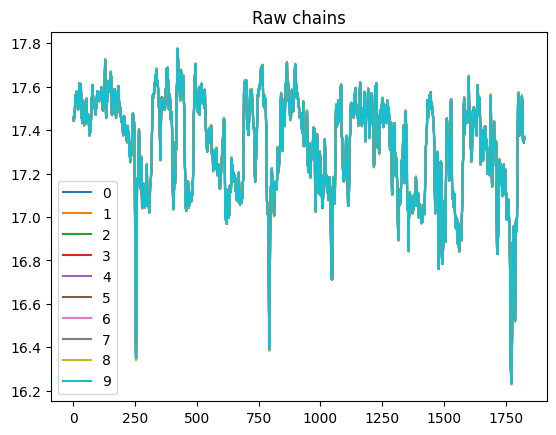

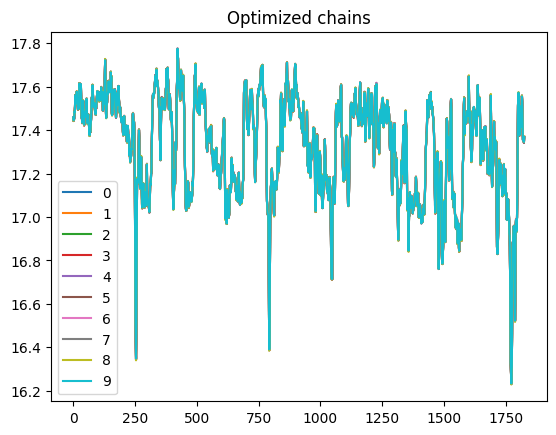

Best chain combination summary:
      mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
sig  0.089  0.005   0.081    0.098        0.0      0.0    1741.0    3857.0   
eps  0.123  0.004   0.115    0.130        0.0      0.0    3994.0    8290.0   

     r_hat  
sig   1.01  
eps   1.00  


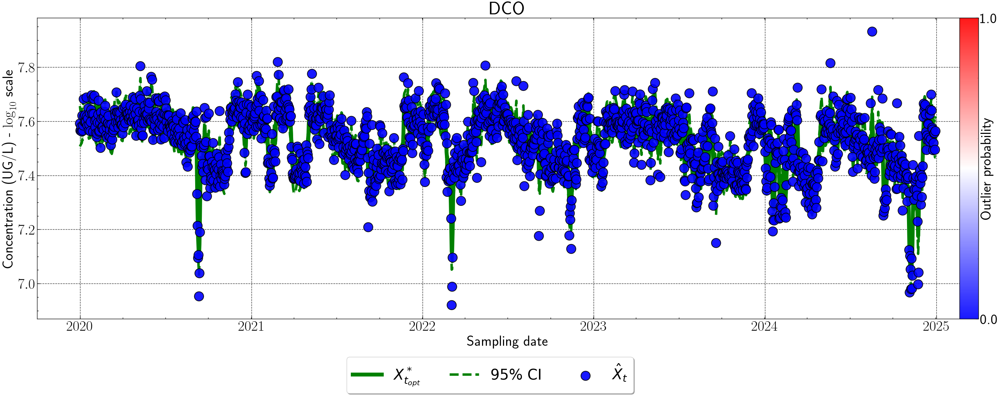

MES
16
(1810, 8)


/opt/anaconda3/envs/pymc5/lib/python3.9/site-packages/pymc/distributions/timeseries.py:558: UserWarning: Initial distribution not specified, defaulting to `Normal.dist(0, 100, shape=...)`. You can specify an init_dist manually to suppress this warning.
  warnings.warn(
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (10 chains in 4 jobs)
NUTS: [sig, eps, latent]


Sampling 10 chains for 4_000 tune and 2_000 draw iterations (40_000 + 20_000 draws total) took 255 seconds.


Raw summary:
      mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
sig  0.084  0.005   0.074    0.095        0.0      0.0    1079.0    2625.0   
eps  0.167  0.004   0.159    0.176        0.0      0.0    3194.0    9303.0   

     r_hat  
sig   1.01  
eps   1.00  


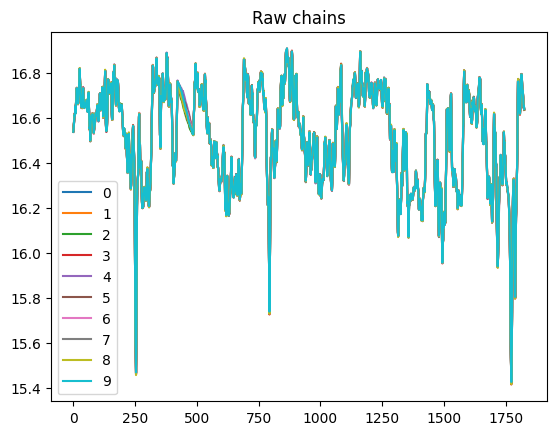

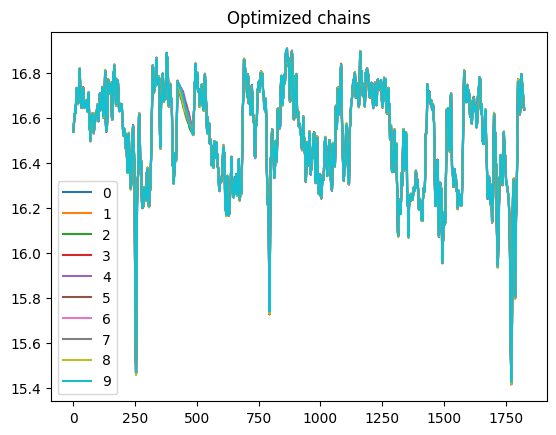

Best chain combination summary:
      mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
sig  0.084  0.005   0.074    0.095        0.0      0.0    1079.0    2625.0   
eps  0.167  0.004   0.159    0.176        0.0      0.0    3194.0    9303.0   

     r_hat  
sig   1.01  
eps   1.00  


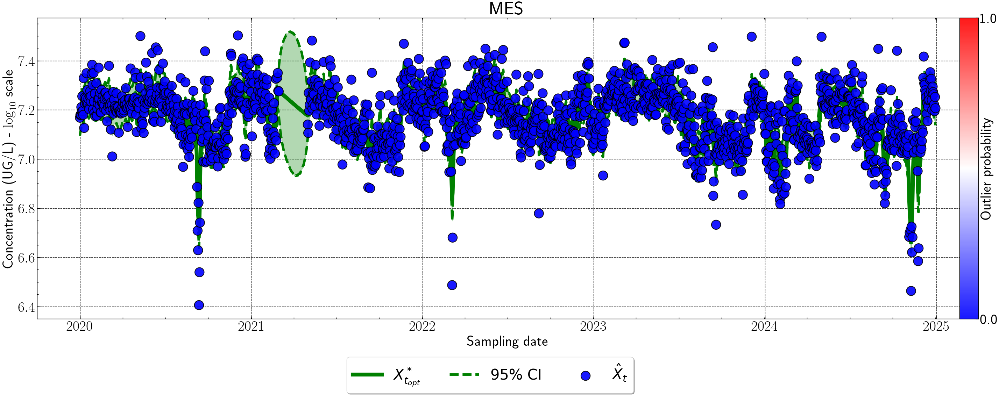

NH4
40
(1786, 8)


/opt/anaconda3/envs/pymc5/lib/python3.9/site-packages/pymc/distributions/timeseries.py:558: UserWarning: Initial distribution not specified, defaulting to `Normal.dist(0, 100, shape=...)`. You can specify an init_dist manually to suppress this warning.
  warnings.warn(
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (10 chains in 4 jobs)
NUTS: [sig, eps, latent]


Sampling 10 chains for 4_000 tune and 2_000 draw iterations (40_000 + 20_000 draws total) took 65 seconds.


Raw summary:
      mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
sig  0.094  0.004   0.087    0.101        0.0      0.0    1837.0    3728.0   
eps  0.074  0.003   0.068    0.081        0.0      0.0    1775.0    3195.0   

     r_hat  
sig   1.00  
eps   1.01  


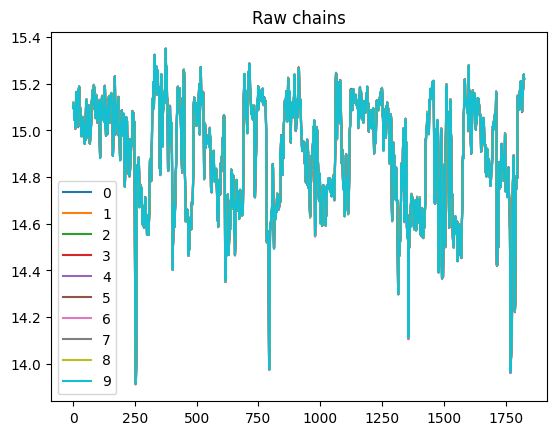

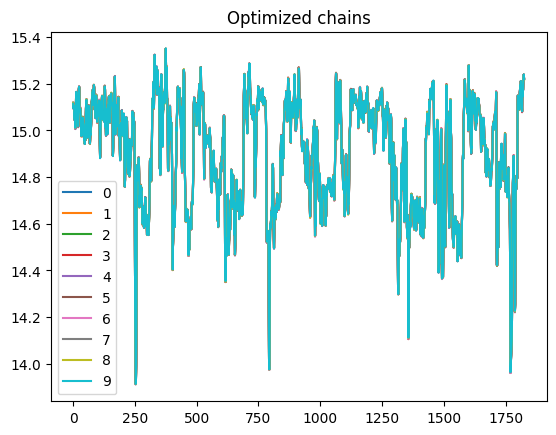

Best chain combination summary:
      mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
sig  0.094  0.004   0.087    0.101        0.0      0.0    1837.0    3728.0   
eps  0.074  0.003   0.068    0.081        0.0      0.0    1775.0    3195.0   

     r_hat  
sig   1.00  
eps   1.01  


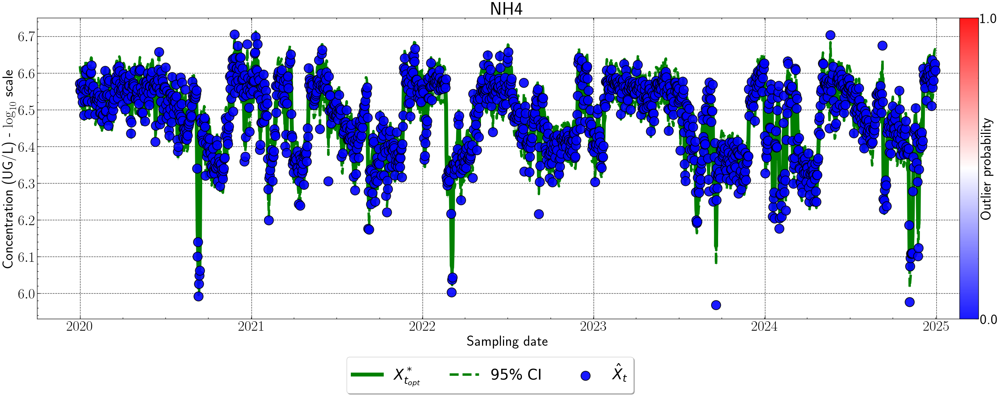

NTK
49
(1777, 8)


/opt/anaconda3/envs/pymc5/lib/python3.9/site-packages/pymc/distributions/timeseries.py:558: UserWarning: Initial distribution not specified, defaulting to `Normal.dist(0, 100, shape=...)`. You can specify an init_dist manually to suppress this warning.
  warnings.warn(
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (10 chains in 4 jobs)
NUTS: [sig, eps, latent]


Sampling 10 chains for 4_000 tune and 2_000 draw iterations (40_000 + 20_000 draws total) took 64 seconds.
The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details


Raw summary:
      mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
sig  0.095  0.003   0.089    0.101        0.0      0.0    1422.0    2608.0   
eps  0.051  0.003   0.045    0.057        0.0      0.0     839.0    1271.0   

     r_hat  
sig   1.00  
eps   1.01  


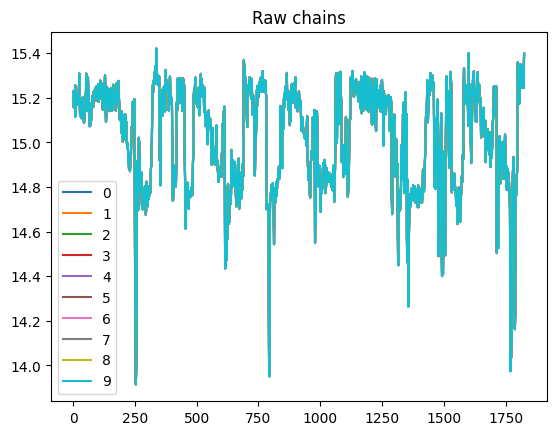

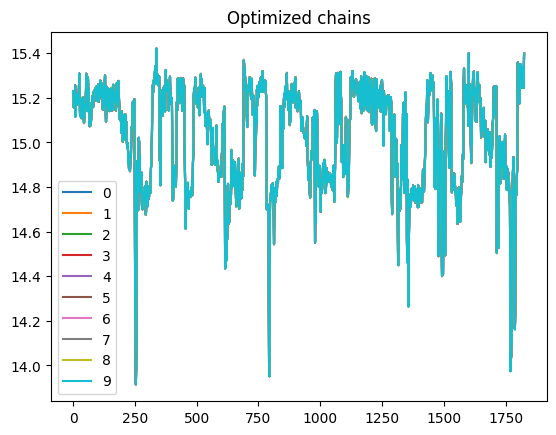

Best chain combination summary:
      mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
sig  0.095  0.003   0.089    0.101        0.0      0.0    1422.0    2608.0   
eps  0.051  0.003   0.045    0.057        0.0      0.0     839.0    1271.0   

     r_hat  
sig   1.00  
eps   1.01  


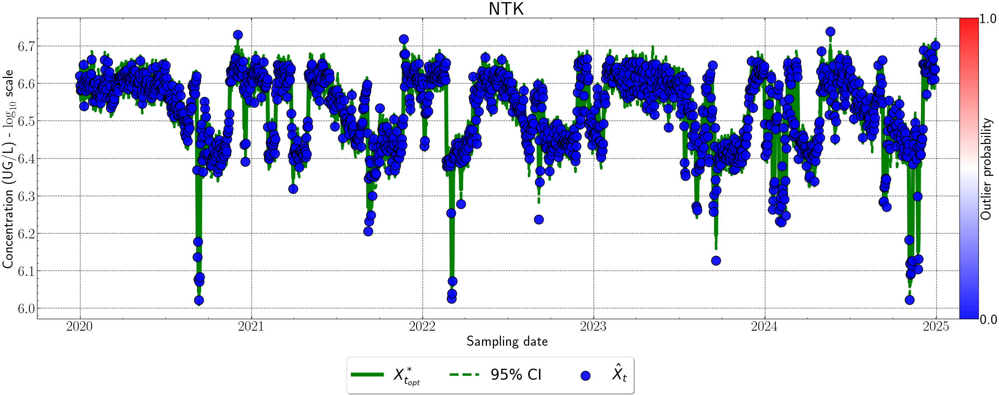

NGL
58
(1768, 8)


/opt/anaconda3/envs/pymc5/lib/python3.9/site-packages/pymc/distributions/timeseries.py:558: UserWarning: Initial distribution not specified, defaulting to `Normal.dist(0, 100, shape=...)`. You can specify an init_dist manually to suppress this warning.
  warnings.warn(
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (10 chains in 4 jobs)
NUTS: [sig, eps, latent]


Sampling 10 chains for 4_000 tune and 2_000 draw iterations (40_000 + 20_000 draws total) took 68 seconds.
The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details


Raw summary:
      mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
sig  0.094  0.003   0.088    0.100        0.0      0.0    1205.0    3627.0   
eps  0.051  0.003   0.045    0.057        0.0      0.0     757.0    1358.0   

     r_hat  
sig   1.01  
eps   1.01  


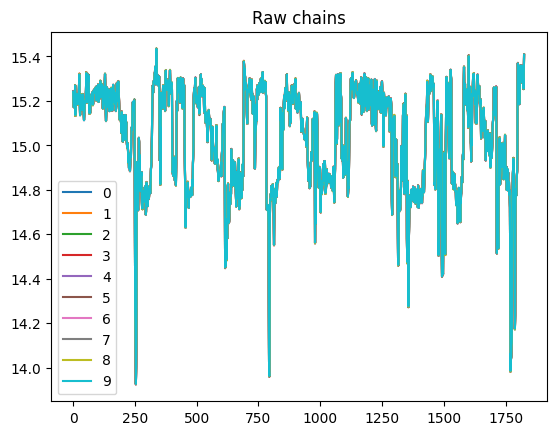

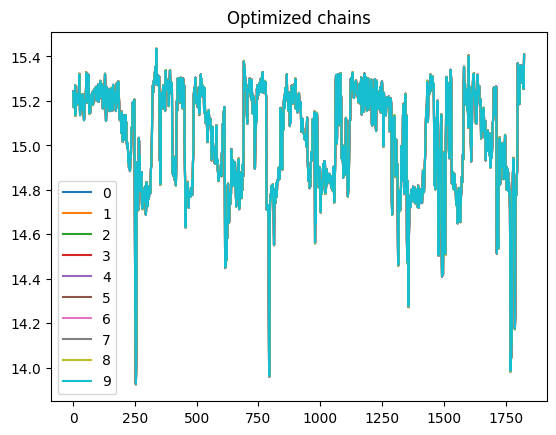

Best chain combination summary:
      mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
sig  0.094  0.003   0.088    0.100        0.0      0.0    1205.0    3627.0   
eps  0.051  0.003   0.045    0.057        0.0      0.0     757.0    1358.0   

     r_hat  
sig   1.01  
eps   1.01  


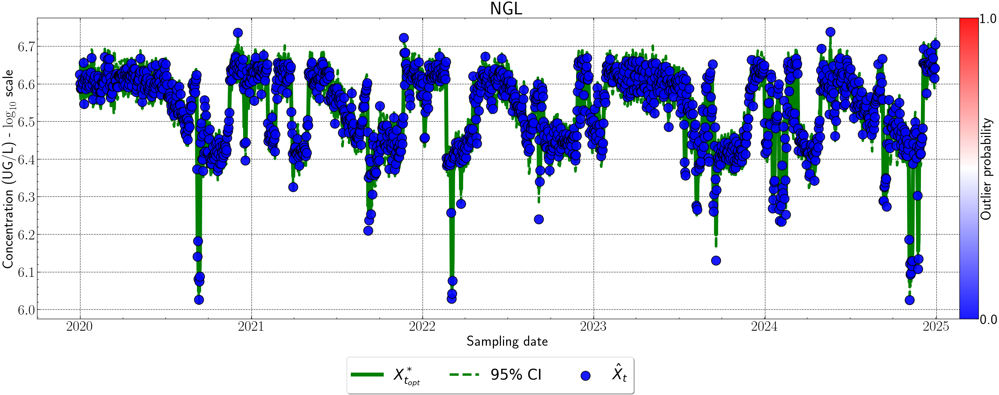

PT
21
(1805, 8)


/opt/anaconda3/envs/pymc5/lib/python3.9/site-packages/pymc/distributions/timeseries.py:558: UserWarning: Initial distribution not specified, defaulting to `Normal.dist(0, 100, shape=...)`. You can specify an init_dist manually to suppress this warning.
  warnings.warn(
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (10 chains in 4 jobs)
NUTS: [sig, eps, latent]


Sampling 10 chains for 4_000 tune and 2_000 draw iterations (40_000 + 20_000 draws total) took 87 seconds.


Raw summary:
      mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
sig  0.087  0.004    0.08    0.094        0.0      0.0    2949.0    6228.0   
eps  0.096  0.003    0.09    0.102        0.0      0.0    4736.0    8900.0   

     r_hat  
sig    1.0  
eps    1.0  


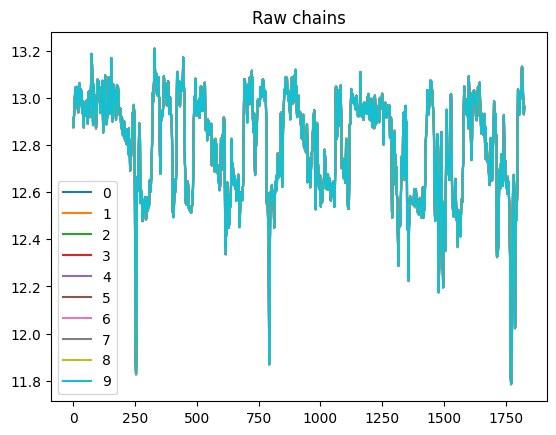

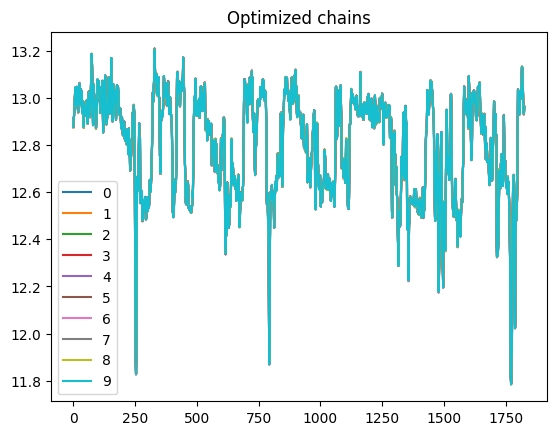

Best chain combination summary:
      mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
sig  0.087  0.004    0.08    0.094        0.0      0.0    2949.0    6228.0   
eps  0.096  0.003    0.09    0.102        0.0      0.0    4736.0    8900.0   

     r_hat  
sig    1.0  
eps    1.0  


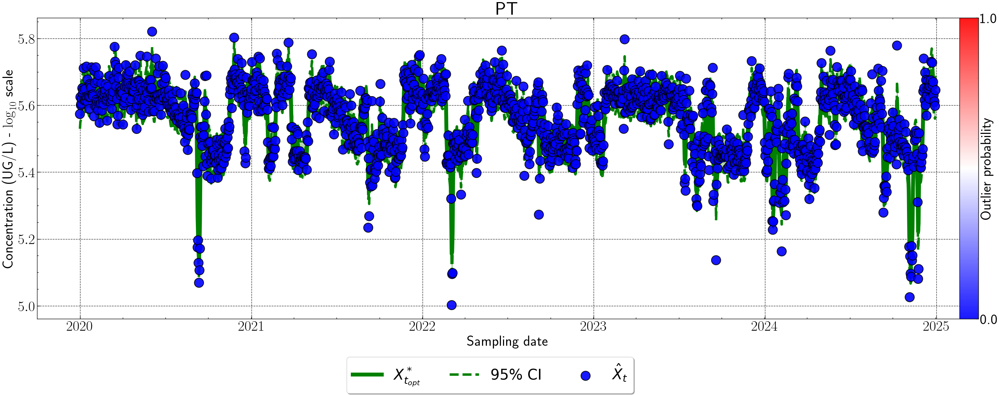

In [18]:
common_flux_data = {}
### Global loop
for this_molecule in list(chain_selector_dict.keys()):

    print("==========")
    print(this_molecule)
    print("==========")
    
    sub_data = get_sub_data(subraw_data, this_molecule, wwtp)

    lod_vect = sub_data.lod.values
    observation_matrix = sub_data.obs.values
    
    snc_ar1_nuts_flux = SCOU_RW1_NUTS(observation_matrix, lod_vect, tuning_iters=tuning_iters, sampling_iters=sampling_iters,
                                 export_name=None, 
                                 p_out_frozen=0.0, nb_chains=nb_chains, export_chains=False,
                                 RW_order=1)
    
    snc_ar1_nuts_flux.fit()

    # getting rid of strongly diverging chains:
    selected_chains = np.arange(nb_chains).tolist()
    remove_those = chain_selector_dict[this_molecule]
    for i in remove_those:
        selected_chains.remove(i)
    
    snc_ar1_nuts_flux.visualize_latents(selected_chains)
    snc_ar1_nuts_flux.predict(selected_chains)

    sub_data = append_and_process_results(sub_data, this_molecule)
    visualize_results(sub_data, this_molecule)

In [19]:
for molecule in list(common_flux_data.keys()):
    this_file = common_flux_data[molecule]
    this_file.to_csv('../outputs/files/pop_estimation_' + wwtp + '_hierarchical_manuscript/' + molecule + '.csv', sep=';', index=False)